affichage de la progression des paramettres pour le cas de la fonction f(x,y)= x² + y² 

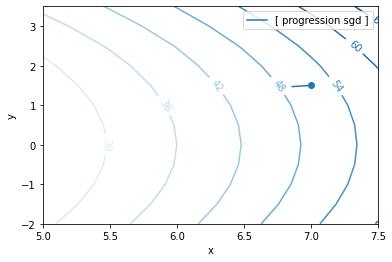

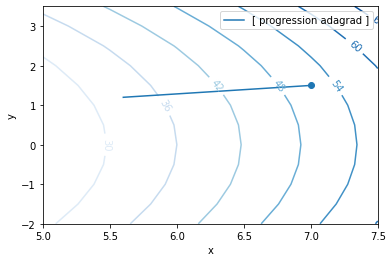

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd



In [2]:
from wrt import rss
data=pd.read_table("data_synthetique_rss.txt",sep=';')
X = np.array(data.values[:,:-1])
y = np.array(data.values[:,-1:])
y = y.reshape(y.shape[0])

b1 = np.arange(-8, 8, 0.05)
b2 = np.arange(-8, 8, 0.05)
B1, B2 = np.meshgrid(b1, b2)
RSS = np.zeros((B1.shape[0], B1.shape[1]))

for i in range(B1.shape[0]):
    for j in range(B1.shape[1]):
        b=np.array([B1[i][j],B2[i][j]])
        RSS[i][j] = rss(X,y,b)

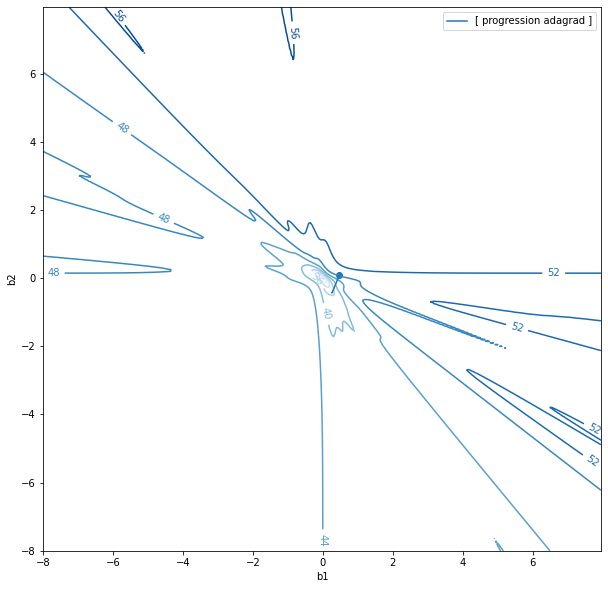

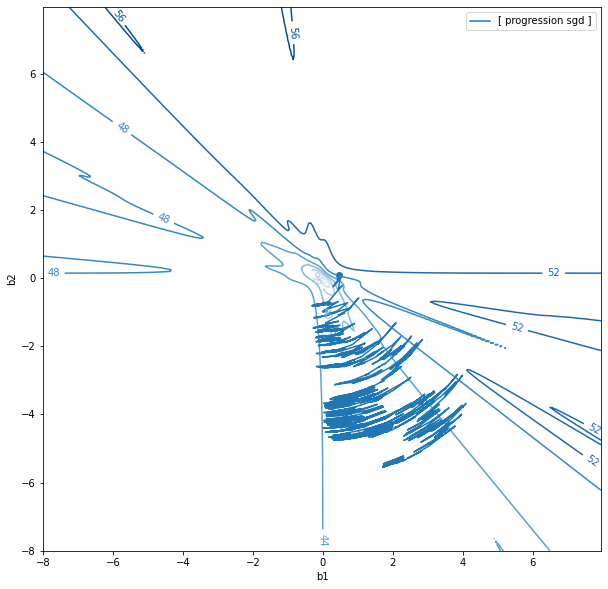

In [3]:

plt.figure(1, figsize=(10,10))
plt.xlabel('b1')
plt.ylabel('b2')
cont=plt.contour(B1, B2, RSS,cmap="Blues")
plt.clabel(cont,fmt='%d')
data=pd.read_table("adagrad_deplacement_rss.txt",sep=';')
a=data.values[:,0]
b=data.values[:,1]
plt.scatter(a[0],b[0])
plt.plot(a,b,label="[ progression adagrad ]")

plt.legend()
plt.show()

plt.figure(1, figsize=(10,10))
plt.xlabel('b1')
plt.ylabel('b2')
cont=plt.contour(B1, B2, RSS,cmap="Blues")
plt.clabel(cont,fmt='%d')

data=pd.read_table("sgd_deplacement_rss.txt",sep=';')
a=data.values[:,0]
b=data.values[:,1]
plt.scatter(a[0],b[0])
plt.plot(a,b,label="[ progression sgd ]")

plt.legend()
plt.show()

In [4]:
import plotly.graph_objects as go

fig = (go.Figure(data=[go.Surface(z=RSS, x=B1, y=B2, colorscale='YlGn', opacity = 0.7, reversescale=True)]))

data=pd.read_table("sgd_deplacement_rss.txt",sep=';')
dep=data.values
z = []
for i in range(data.shape[0]):
    z.append( rss(X,y, dep[i]).tolist() )
fig.add_scatter3d(x=dep[:,0], y=dep[:,1], z=z, mode='markers', marker=dict(size=3, colorscale='YlGn', opacity = 0.9))

data=pd.read_table("adagrad_deplacement_rss.txt",sep=';')
dep=data.values
z = []
for i in range(data.shape[0]):
    z.append( rss(X,y, dep[i]).tolist() )
fig.add_scatter3d(x=dep[:,0], y=dep[:,1], z=z, mode='markers', marker=dict(size=3, colorscale='YlGn', opacity = 0.9))

fig.update_layout(template= "plotly_dark", margin=dict(l=0, r=0, b=0, t=0))
fig.layout.scene.camera.projection.type = "orthographic"
fig.show()

/tmp/ipykernel_56821/1600072552.py:4: MatplotlibDeprecationWarning:

Axes3D(fig) adding itself to the figure is deprecated since 3.4. Pass the keyword argument auto_add_to_figure=False and use fig.add_axes(ax) to suppress this warning. The default value of auto_add_to_figure will change to False in mpl3.5 and True values will no longer work in 3.6.  This is consistent with other Axes classes.



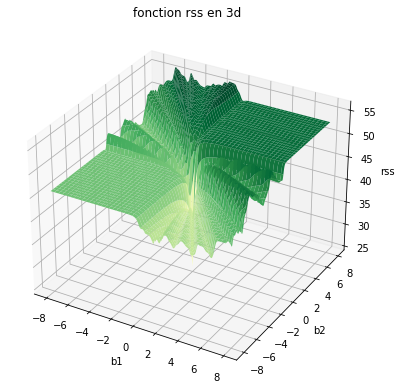

In [5]:
from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(5,5))
ax = Axes3D(fig)
ax.set_title("fonction rss en 3d")
ax.set_xlabel("b1")
ax.set_ylabel("b2")
ax.set_zlabel("rss")
ax.plot_surface(B1, B2, RSS, cmap="YlGn")